In [2]:
# Import libraries
import os  # For interacting with the file system
import shutil  # For managing files and directories in a cross-platform manner
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from glob import glob  # For finding file path
from tqdm import tqdm # For progress bars

# Data preprocessing
from keras.preprocessing.image import ImageDataGenerator  # For image data augmentation

from tensorflow import keras
from tensorflow.keras import layers

In [3]:
# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots

# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models

In [4]:
# Set the path to the dataset
data_path = 'C:\\Users\\91838\\Animal-species-Recognization-using-CNN\\Training'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)

Class Names: 
 ['Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Hen', 'Horse', 'Spider', 'Squirrel', 'Tiger']
Number of Classes: 10


In [5]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [1952, 1997, 1897, 1989, 1988, 1995, 1485, 1996, 1912, 1955]


In [6]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

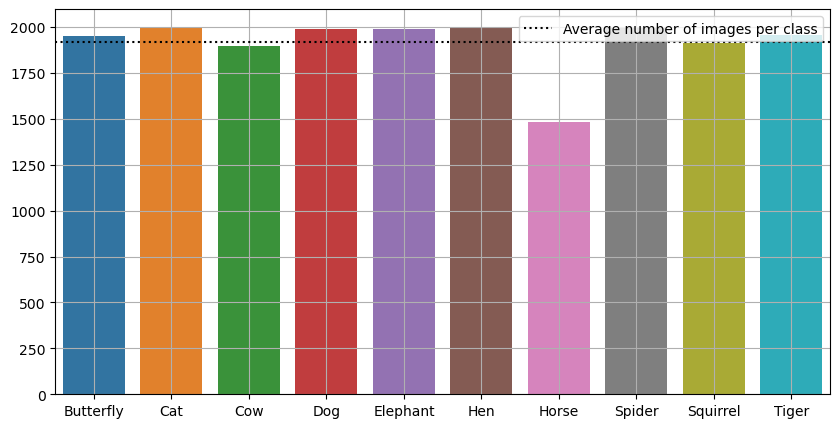

In [7]:
# Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [9]:
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

# Loop through each class directory and copy a percentage of the images to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
     # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name)
    # Create the sampled class directory if it doesn't exist
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
    # Get a list of all the image files in the class directory
    image_files = os.listdir(class_path)
    # Calculate the number of images to sample
    num_images = int(len(image_files) * sample_percent)
    # Sample the images
    sampled_images = np.random.choice(image_files, size=num_images, replace=False)
    # Copy the sampled images to the sampled class directory
    for image_name in sampled_images:
        src_path = os.path.join(class_path, image_name)
        dst_path = os.path.join(sampled_class_path, image_name)
        shutil.copyfile(src_path, dst_path)

In [10]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [195, 199, 189, 198, 198, 199, 148, 199, 191, 195]


In [11]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

In [12]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255, 
    horizontal_flip=True, 
    vertical_flip=True, 
    rotation_range=20, 
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='training')
# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='validation')

Found 1534 images belonging to 10 classes.
Found 377 images belonging to 10 classes.


In [13]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)
    
    # Set the title of the plot if provided
    plt.title(image_title)
    
    # Turn off the axes in the plot
    plt.axis('off')

In [14]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label

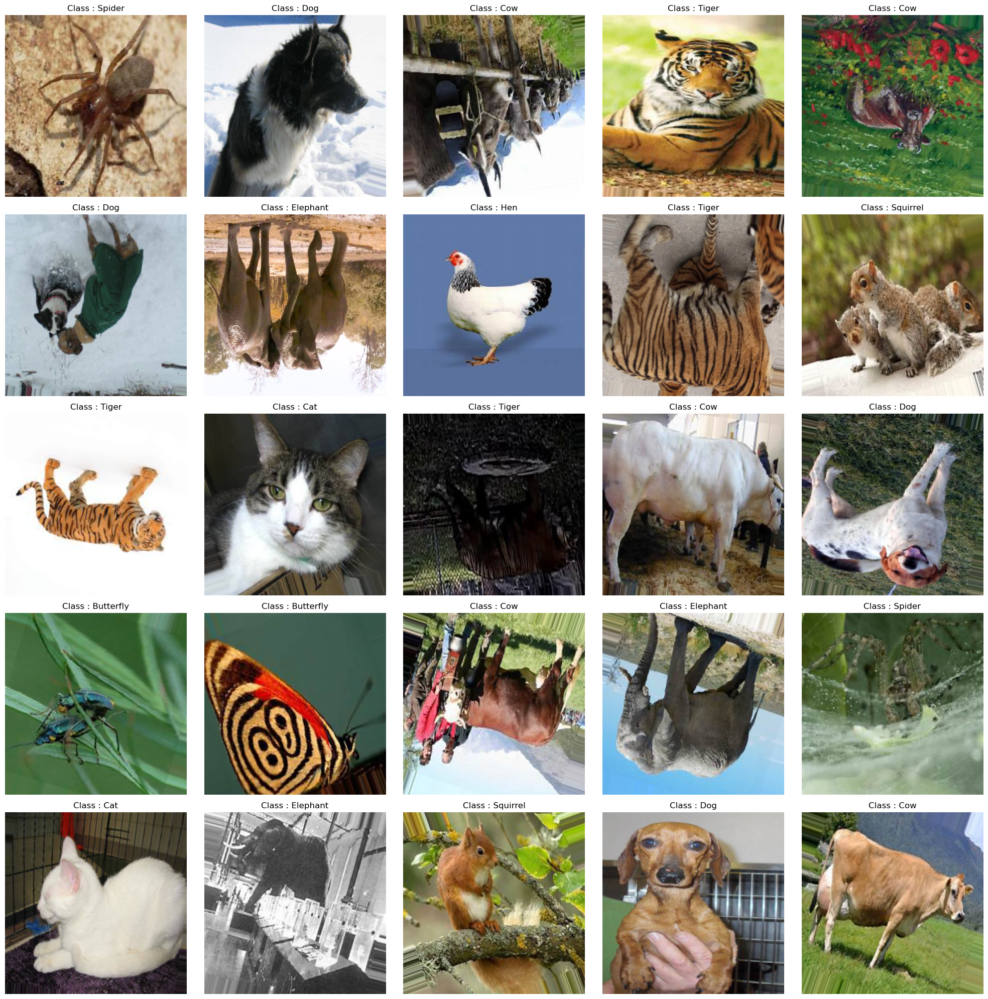

In [15]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):
    
    # Get a random image and label
    image, label = get_random_data([images, labels])
    
    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")
    
    # Increment the counter
    counter+=1
    
    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()





Epoch 1/25


48/48 [==============================] - ETA: 0s - loss: 0.6954 - accuracy: 0.7927 

C:\Users\91838\anaconda3\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



48/48 [==============================] - 636s 13s/step - loss: 0.6954 - accuracy: 0.7927 - val_loss: 0.3463 - val_accuracy: 0.8753
Epoch 2/25
48/48 [==============================] - 581s 12s/step - loss: 0.3225 - accuracy: 0.8977 - val_loss: 0.3034 - val_accuracy: 0.9045
Epoch 3/25
48/48 [==============================] - 627s 13s/step - loss: 0.2176 - accuracy: 0.9283 - val_loss: 0.3269 - val_accuracy: 0.8966
Epoch 4/25
48/48 [==============================] - 565s 12s/step - loss: 0.1947 - accuracy: 0.9400 - val_loss: 0.2562 - val_accuracy: 0.9284
Epoch 5/25
48/48 [==============================] - 505s 11s/step - loss: 0.1575 - accuracy: 0.9387 - val_loss: 0.2092 - val_accuracy: 0.9337
Epoch 6/25
48/48 [==============================] - 484s 10s/step - loss: 0.1376 - accuracy: 0.9563 - val_loss: 0.3362 - val_accuracy: 0.9045
Epoch 7/25
48/48 [==============================] - 478s 10s/step - loss: 0.1184 - accuracy: 0.9602 - val_loss: 0.3411 - val_accuracy: 0.8939
Epoch 8/25
48/48 

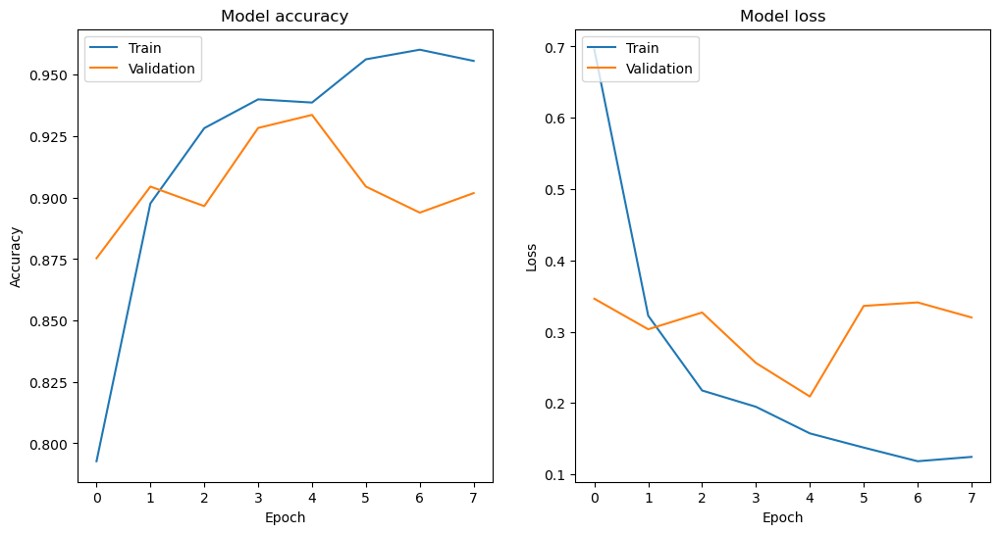

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Specify the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Load the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 25 epochs and the previously defined callbacks.
history = resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=25, callbacks=cbs
)

# Plot training history
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()


Epoch 1/25
48/48 [==============================] - 120s 2s/step - loss: 0.9064 - accuracy: 0.7158 - val_loss: 0.4283 - val_accuracy: 0.8594
Epoch 2/25
48/48 [==============================] - 119s 2s/step - loss: 0.4167 - accuracy: 0.8696 - val_loss: 0.3335 - val_accuracy: 0.8859
Epoch 3/25
48/48 [==============================] - 120s 3s/step - loss: 0.3577 - accuracy: 0.8840 - val_loss: 0.3500 - val_accuracy: 0.8939
Epoch 4/25
48/48 [==============================] - 124s 3s/step - loss: 0.3233 - accuracy: 0.9016 - val_loss: 0.2997 - val_accuracy: 0.8939
Epoch 5/25
48/48 [==============================] - 123s 3s/step - loss: 0.2397 - accuracy: 0.9185 - val_loss: 0.3644 - val_accuracy: 0.8912
Epoch 6/25
48/48 [==============================] - 129s 3s/step - loss: 0.2631 - accuracy: 0.9107 - val_loss: 0.4086 - val_accuracy: 0.8727
Epoch 7/25
48/48 [==============================] - 124s 3s/step - loss: 0.2377 - accuracy: 0.9257 - val_loss: 0.2852 - val_accuracy: 0.9098
Epoch 8/25
48

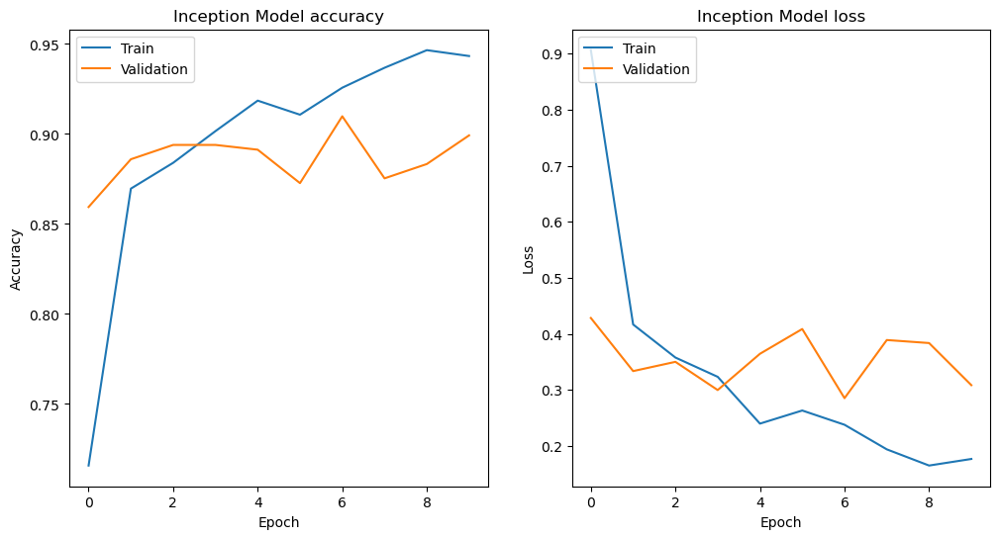

In [17]:
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256, 256, 3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GlobalAveragePooling2D(),  # Add Global Average Pooling layer
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model and store the training history
history_inception = inception.fit(train_data, validation_data=valid_data, epochs=25, callbacks=cbs)

# Plot training history for Inception
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history_inception.history['accuracy'])
plt.plot(history_inception.history['val_accuracy'])
plt.title('Inception Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_inception.history['loss'])
plt.plot(history_inception.history['val_loss'])
plt.title('Inception Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

Epoch 1/50
48/48 [==============================] - 199s 4s/step - loss: 0.7546 - accuracy: 0.7725 - val_loss: 0.3288 - val_accuracy: 0.8886
Epoch 2/50
48/48 [==============================] - 210s 4s/step - loss: 0.3251 - accuracy: 0.8957 - val_loss: 0.3983 - val_accuracy: 0.8753
Epoch 3/50
48/48 [==============================] - 201s 4s/step - loss: 0.2627 - accuracy: 0.9100 - val_loss: 0.3876 - val_accuracy: 0.8806
Epoch 4/50
48/48 [==============================] - 201s 4s/step - loss: 0.2236 - accuracy: 0.9302 - val_loss: 0.3502 - val_accuracy: 0.8806


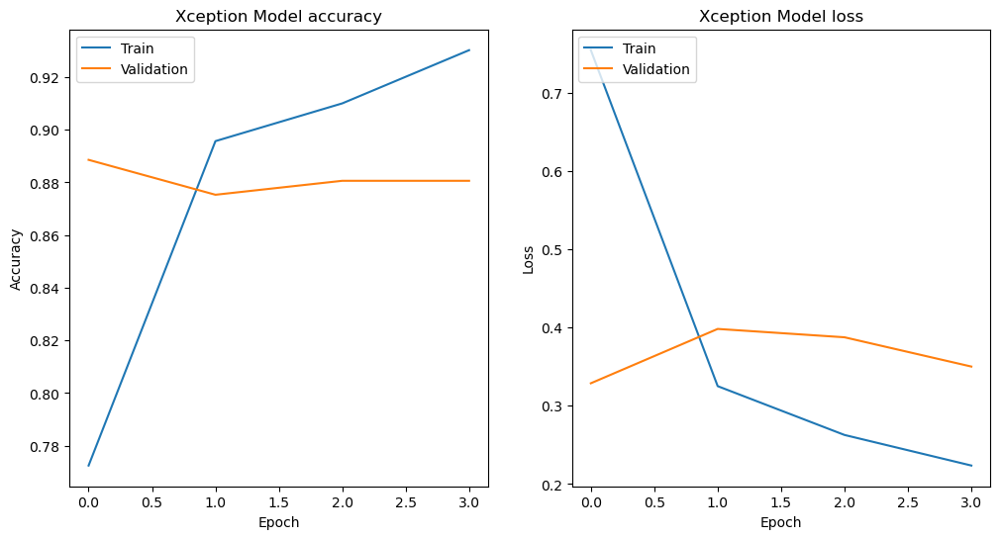

In [18]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Specify the name of the model as "Xception".
name = "Xception"

# Load the pre-trained Xception model, freeze its weights and exclude its final classification layer.
base_model = Xception(include_top=False, input_shape=(256, 256, 3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the Xception base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
num_classes = 10  # Replace 10 with the actual number of classes in your dataset
xception = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer, and accuracy as the evaluation metric.
xception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model and store the training history
history_xception = xception.fit(train_data, validation_data=valid_data, epochs=50, callbacks=cbs)

# Plot training history for Xception
plt.figure(figsize=(12, 6))

# Plot training & validation accuracy values
plt.subplot(1, 2, 1)
plt.plot(history_xception.history['accuracy'])
plt.plot(history_xception.history['val_accuracy'])
plt.title('Xception Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history_xception.history['loss'])
plt.plot(history_xception.history['val_loss'])
plt.title('Xception Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [19]:
#Importing load model
from keras.models import load_model # For loading pre-trained models

# set the file path to the pre-trained model
model_file_path = "C:\\Users\\91838\\Animal-species-Recognization-using-CNN\\ResNet152V2.h5"


# load the pre-trained model
loaded_model = load_model(model_file_path)

# print a summary of the model's architecture
loaded_model.summary()

Model: "ResNet152V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                2570      
                                                                 
Total params: 58858762 (224.53 MB)
Trainable params: 527114 (2.01 MB)
Non-trainable params: 58331648 (222.52 MB)
________

In [20]:
#This line of code evaluates the performance of the pre-trained model on the validation dataset.
loaded_model.evaluate(valid_data)

12/12 [==============================] - 88s 7s/step - loss: 0.2293 - accuracy: 0.9257


[0.22933648526668549, 0.9257294535636902]

1/1 [==============================] - 0s 329ms/step


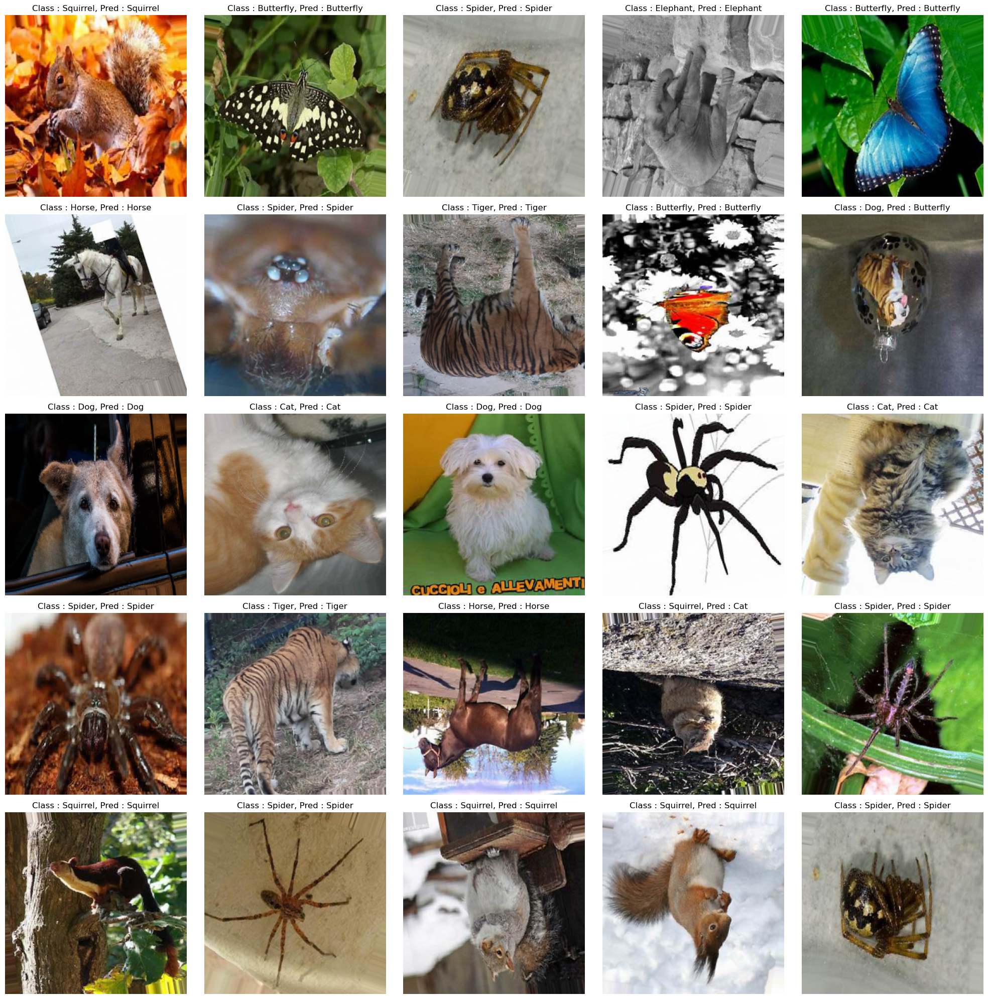

In [21]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):
    
    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]
    
    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")
    
    # Make sure to end the Loop
    i+=1
    if i>=26: break
        

plt.tight_layout()
plt.show()

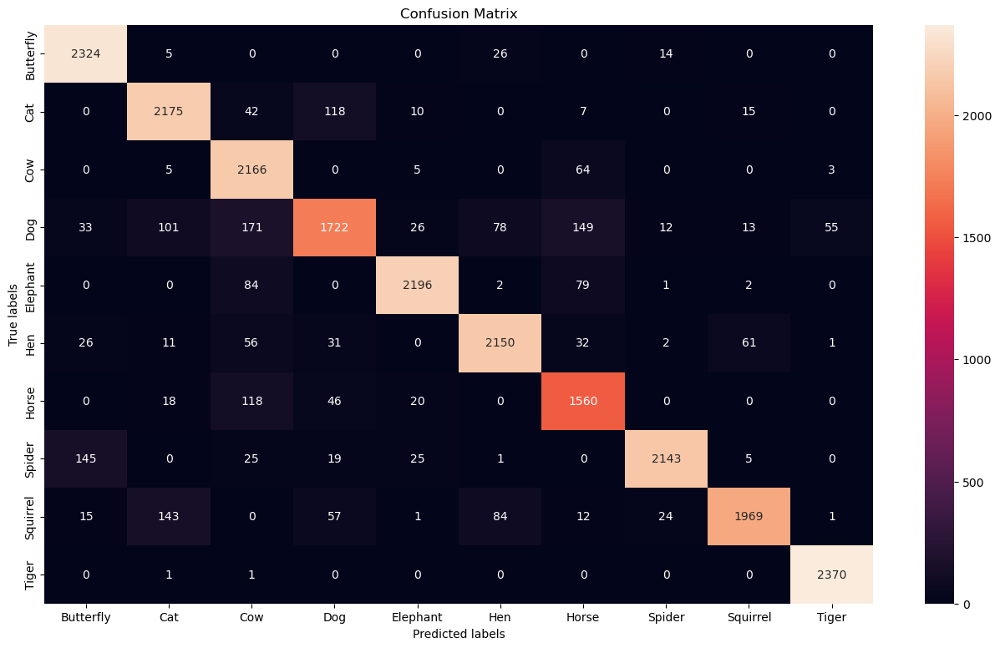

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Assuming true_labels and predicted_labels are already defined
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(16,9))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [26]:
from sklearn.metrics import classification_report

# Calculate and display classification report (precision and recall)
class_labels = class_names
cr = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("Classification Report:")
print(cr)


Classification Report:
              precision    recall  f1-score   support

   Butterfly       0.91      0.98      0.95      2369
         Cat       0.88      0.92      0.90      2367
         Cow       0.81      0.97      0.88      2243
         Dog       0.86      0.73      0.79      2360
    Elephant       0.96      0.93      0.95      2364
         Hen       0.92      0.91      0.91      2370
       Horse       0.82      0.89      0.85      1762
      Spider       0.98      0.91      0.94      2363
    Squirrel       0.95      0.85      0.90      2306
       Tiger       0.98      1.00      0.99      2372

    accuracy                           0.91     22876
   macro avg       0.91      0.91      0.91     22876
weighted avg       0.91      0.91      0.91     22876

